#**Install YOLOv5 dependencies**

In [1]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  
%cd yolov5

# install Yolo
!pip install -qr requirements.txt  # install dependencies

# import lib
import torch

from IPython.display import Image, display # to display images
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Cloning into 'yolov5'...
remote: Enumerating objects: 12078, done.
remote: Total 12078 (delta 0), reused 0 (delta 0), pack-reused 12078
Receiving objects: 100% (12078/12078), 11.82 MiB | 33.45 MiB/s, done.
Resolving deltas: 100% (8382/8382), done.
/content/yolov5
     |████████████████████████████████| 596 kB 32.6 MB/s 
Setup complete. Using torch 1.11.0+cu113 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


#**Download custom data from Roboflow**

In [2]:
%cd /content/yolov5
# install roboflow lib
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Fx5PC5J5tOPooP4X2WLe")
project = rf.workspace("joseph-nelson").project("chess-pieces-new")
dataset = project.version(19).download("yolov5")

/content/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 145 kB 34.9 MB/s 
     |████████████████████████████████| 178 kB 63.4 MB/s 
     |████████████████████████████████| 1.1 MB 58.8 MB/s 
     |████████████████████████████████| 67 kB 7.7 MB/s 
     |████████████████████████████████| 54 kB 3.6 MB/s 
     |████████████████████████████████| 138 kB 65.3 MB/s 
     |████████████████████████████████| 63 kB 2.1 MB/s 
  Created wheel for roboflow: filename=roboflow-0.2.4-py3-none-any.whl size=21356 sha256=0b604ef9f5f1846e572397e33b82677cc70879ab4487dbba7006f87c5985044b
  Stored in directory: /root/.cache/pip/wheels/b7/2c/60/3733c0e323b1d7aec00f852264314bf6c48192c8e1dc92b3ee
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=c6b7a9d9375017ba3c55cf510e427a807ca381f35206c8bc67ff5628ee55445d
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacc

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Chess-Pieces-19 in yolov5pytorch:: 100%|██████████| 4226/4226 [00:03<00:00, 1304.33it/s]


In [17]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- bishop
- black-bishop
- black-king
- black-knight
- black-pawn
- black-queen
- black-rook
- white-bishop
- white-king
- white-knight
- white-pawn
- white-queen
- white-rook
nc: 13
train: Chess-Pieces-19/train/images
val: Chess-Pieces-19/valid/images


#**Define Model Configuration and Architecture**

In [3]:
# define number of classes based on data.yaml
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [4]:
# customize iPython writefile so we can write variables to the custom yaml file
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [5]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors: 3
  # - [29,19, 44,13, 21,34]  # P3/8
  # - [45,21, 57,23, 47,29]  # P4/16
  # - [37,44, 75,25, 62,35]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

#**Train the model**

In [6]:
# train yolov5s on custom data for 50 epochs
# time its performance
%%time 
%cd /content/yolov5/
!python train.py --img 416 --batch 40 --epochs 45 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/yolov5/Chess-Pieces-19/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=45, batch_size=40, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-223-g1dcb774 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0

#**Display the Performance of the model**

In [7]:
# we use tensorboard to compare between the models we write to choose the best of them
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

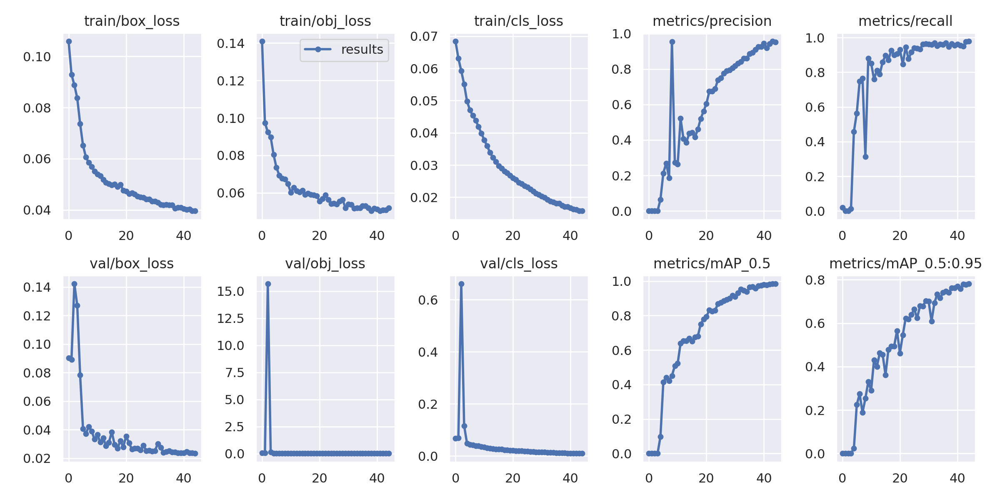

In [10]:
# we plot the result
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

GROUND TRUTH AUGMENTED TRAINING DATA:


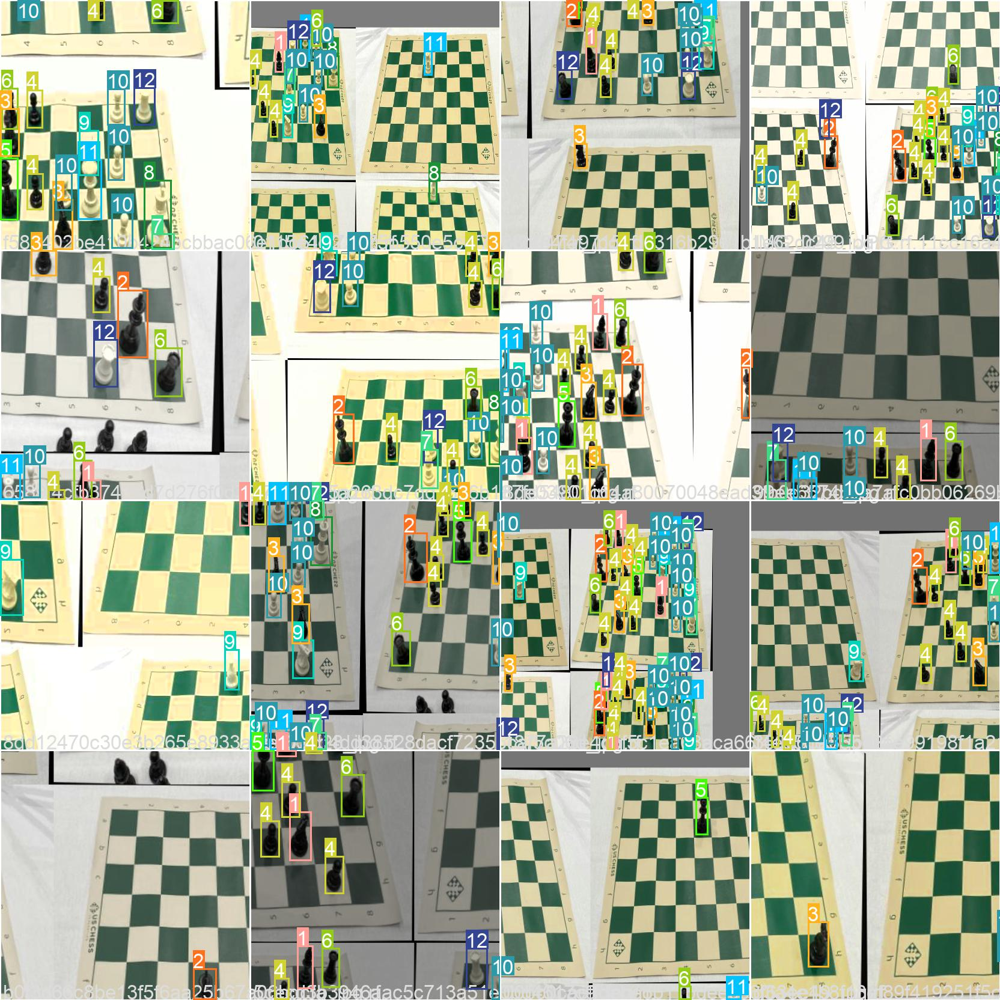

In [15]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

#**Test the model**

In [16]:
# we test our model using test images
# use the best weights If we want to test on the basis of the best epoch
# use the last weights If we want to test on the basis of the last epoch we trained
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source Chess-Pieces-19/test/images --save-txt

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=Chess-Pieces-19/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-223-g1dcb774 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7278882 parameters, 0 gradients, 16.9 GFLOPs
image 1/29 /content/yolov5/Chess-Pieces-19/test/images/0b47311f426ff926578c9d738d683e76_jpg.rf.40183eae584a653181bbd795ba3c353f.jpg: 416x416 1 white-bishop, Done. (0.011s)
image 2/29 /content/yolov5/Chess-Pieces-19/test/images/1c0060ef868bdc326ce5e6389cb6732f_jpg.rf.f02cd668d26a53d9bf001497992b3657.jpg: 416x416 1 wh

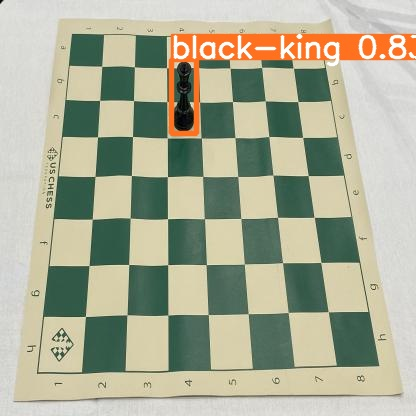

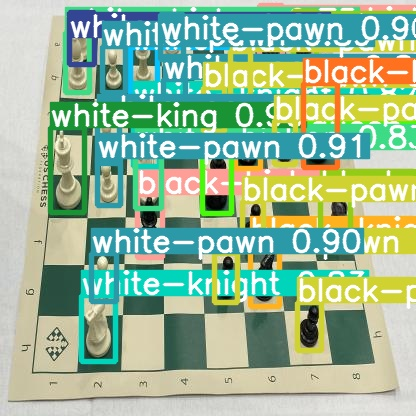

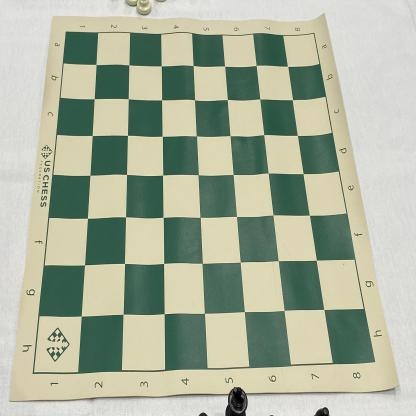

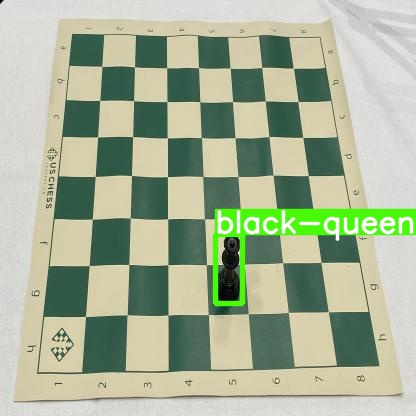

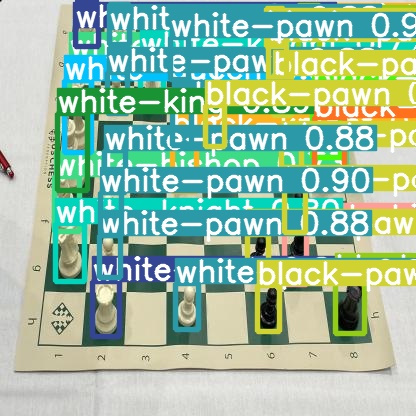

...

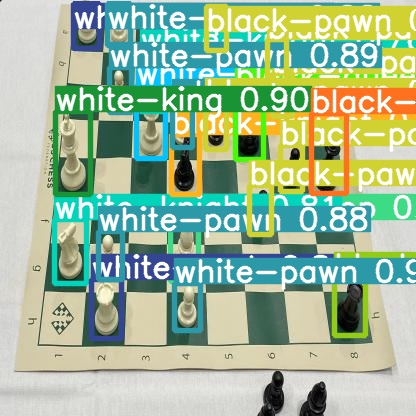

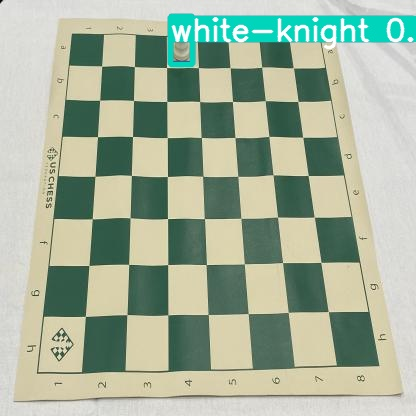

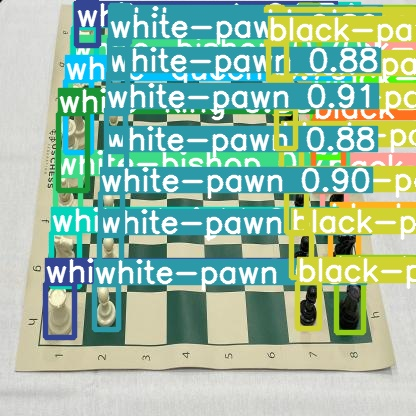

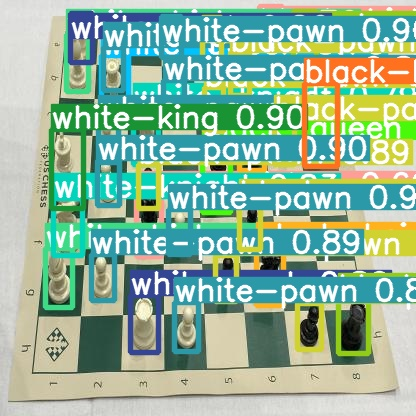

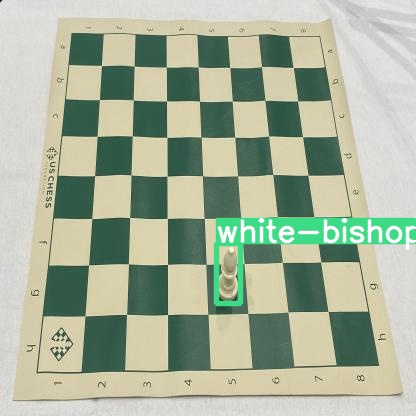

In [17]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'):
    display(Image(filename=imageName,width=900))
    print("\n")